In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import os

from utils import *
from ipywidgets import interact, fixed

# Functions

In [2]:
def compute_pred(single_sim):
    ''' computes the reals '''
    preds = []
    for period in single_sim:
        start_price = period[0][2]
        for i in range(len(period)):
            expected = np.exp(period[:, 0][:i+1].sum())
            preds.append(start_price * expected)
    return preds

In [3]:
def viz_quantiles(ticker, true_data, quantiles, config: Config):
    ''' visualize quantiles '''
    Yactual = true_data[ticker]['close']
    Xactual = range(len(Yactual))

    start = config.get_test_start_point(true_data[ticker])
    test = true_data[ticker]['close'].copy()

    for x in quantiles[ticker]:
        Ypred = compute_pred(quantiles[ticker][x])
        df = pd.DataFrame(list(Ypred), index = true_data[ticker].index[start:start+len(Ypred)], columns = [x])
        assert data[ticker]['close'][start] == quantiles[ticker][x][0][0][2] # check starting points are the same
        test = pd.concat([test, df], axis = 1)

    
    fig = px.line(test, x = test.index, y = ['close'] + list(quantiles[ticker].keys()), )
    cutoffs = config.period_cutoffs(true_data[ticker])[0]
    for x in cutoffs:
        fig.add_vline(x = x, line_width = .5, line_color = 'red')
    fig.show()


In [4]:
def cum_pnl(pnl):
    ''' get cumulative pnl'''
    cumpnl = []
    ret = 1
    for p in pnl:
        ret *= p
        cumpnl.append(ret)
    return np.array(cumpnl)

In [46]:
def buy_and_hold(true_data):
    rets = []
    for ticker in true_data:
        data = true_data[ticker]['close']
        ret = (data[-1] - data[0]) / data[0]
        rets.append(ret)
    return np.array(rets).mean()

# Retrieve Ran Data

In [13]:
# Configs
rootdir = '.'
tconfig = Config(rootdir, 'thresholding')
pconfig = Config(rootdir, 'changing_p')
cconfig = Config(rootdir, 'control')

Load True Data

In [14]:
data = cconfig.load_true_data()
tickers = cconfig.get_tickers()

AAPL.csv
CVX.csv
DVN.csv
GS.csv
JNJ.csv
JPM.csv
MRK.csv
NVDA.csv
PFE.csv
TSLA.csv
V.csv
XOM.csv


In [15]:
# viz data
def viz_true_data(ticker):
    t = data[ticker].plot(y = 'close')
x = interact(viz_true_data, ticker = cconfig.get_tickers())

interactive(children=(Dropdown(description='ticker', options=('AAPL', 'CVX', 'DVN', 'GS', 'JNJ', 'JPM', 'MRK',…

# Create Plots

I have created some basic ugly plots to view data

plot('xlabel', 'ylabel', data=obj) --> can be used like px express with dataframes....

B&H

In [47]:
buy_and_hold(true_data=data)

2.3741878749553305

Control

In [33]:
# retrieve data
csim1 = cconfig.load_sim1_data()
cpage_rank, ctrue_log_returns = cconfig.load_sim2_data()
cquantiles = cconfig.load_quantiles()


Computing PnL (period): 100%|██████████| 35/35 [00:00<00:00, 35119.77it/s]


In [ ]:
# compute metrics
cM = Metrics(csim1, cpage_rank, ctrue_log_returns, top_n = len(tickers))
cmetrics = cM.all_metrics()
cconfig.save_metrics(cmetrics, top_n = len(tickers))

In [34]:
# quantiles (For some reason interact wouldnt work with it so I guess its manual now)
ticker = 'AAPL'
viz_quantiles(ticker = ticker, true_data=data, quantiles=cquantiles, config = cconfig)

Text(0.5, 1.0, 'Strategy Performance')

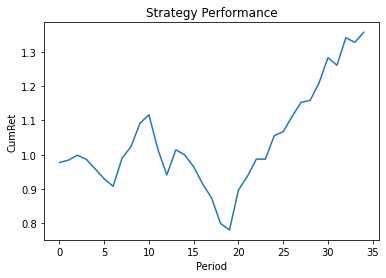

In [35]:
plt.plot(range(len(cmetrics['pnl'])), cum_pnl(cmetrics['pnl']))
plt.xlabel('Period')
plt.ylabel('CumRet')
plt.title('Strategy Performance')

In [32]:
cmetrics['ret']

1.357026274748582

Thresholding

In [25]:
# retrieve data
tsim1 = tconfig.load_sim1_data()
tpage_rank, ttrue_log_returns = tconfig.load_sim2_data()
tquantiles = tconfig.load_quantiles()

In [36]:
# compute metrics
tM = Metrics(tsim1, tpage_rank, ttrue_log_returns, top_n = len(tickers))
tmetrics = tM.all_metrics()
tconfig.save_metrics(tmetrics, top_n = len(tickers))

Computing PnL (period): 100%|██████████| 35/35 [00:00<00:00, 35086.20it/s]


In [37]:
# quantiles (For some reason interact wouldnt work with it so I guess its manual now)
ticker = 'AAPL'
viz_quantiles(ticker = ticker, true_data=data, quantiles=tquantiles, config = tconfig)

Text(0.5, 1.0, 'Strategy Performance')

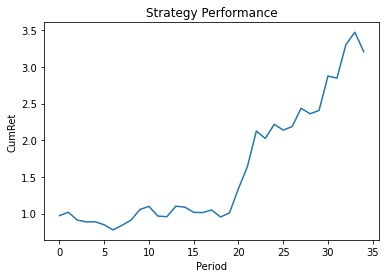

In [38]:
plt.plot(range(len(tmetrics['pnl'])), cum_pnl(tmetrics['pnl']))
plt.xlabel('Period')
plt.ylabel('CumRet')
plt.title('Strategy Performance')

In [39]:
tmetrics['ret']

3.2059789733608035

Changing P

In [41]:
# retrieve data
psim1 = pconfig.load_sim1_data()
ppage_rank, ptrue_log_returns = pconfig.load_sim2_data()
pquantiles = pconfig.load_quantiles()

In [42]:
# compute metrics
pM = Metrics(psim1, ppage_rank, ptrue_log_returns, top_n = len(tickers))
pmetrics = pM.all_metrics()
pconfig.save_metrics(pmetrics, top_n = len(tickers))

Computing PnL (period): 100%|██████████| 35/35 [00:00<00:00, 35102.97it/s]


In [48]:
# quantiles (For some reason interact wouldnt work with it so I guess its manual now)
ticker = 'XOM'
viz_quantiles(ticker = ticker, true_data=data, quantiles=pquantiles, config = pconfig)


Text(0.5, 1.0, 'Strategy Performance')

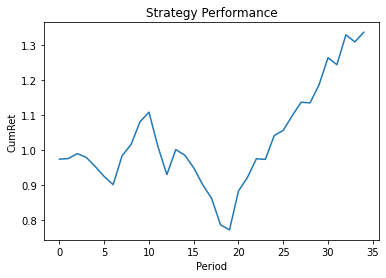

In [44]:
plt.plot(range(len(pmetrics['pnl'])), cum_pnl(pmetrics['pnl']))
plt.xlabel('Period')
plt.ylabel('CumRet')
plt.title('Strategy Performance')

In [45]:
pmetrics['ret']

1.337275938530148

# Broken Beyond this Point

In [5]:
# load simdata
simdata = {}
for ticker in data:
    simdata[ticker] = np.load(os.path.join(root, f'{ticker}/simulation.npy'))

In [6]:
# load metric_data
metric_data = {}
for ticker in data:
    print(ticker)
    metricdata = np.load(os.path.join(root, f'{ticker}/metrics.npz'))
    metric_data[ticker] = {}
    for arr in metricdata.files:
        metric_data[ticker][arr] = metricdata[arr]
    metricdata.close()

V
NVDA
GS
JPM
TSLA
AAPL


Assert Simulation is correct shape

In [7]:
pred_period = 140
# check to make sure simdata is of size (runs, X periods, 140, 3)
for ticker, d in simdata.items():
    assert d.shape == (d.shape[0], d.shape[1], pred_period, 3)

In [8]:
ticker = 'AAPL'
simdata[ticker][0, 0, 0]

array([-4.11117591e-04,  0.00000000e+00,  4.16600000e+01])

Observe a single sample of ticker AAPL

for stat, metric in metric_data[ticker].items():
    print(f'{stat}:\n', metric[0])


# Computing Summary Statistics

Assumptions:
- Each individual month period can be considered a seperate MC prediction so it is acceptable to swap PnL, sharpe etc. for each period
- When capturing quantile runs, we use the final expected return as the measure for quantile location. Therefore, it does not correspond that a max run would also produce the max PnL, but rather a PnL that occurs if the max simulation ran happened.
- Quantiles are computed using a closest algorithm to avoid averaging when the number of simulations are even. Otherwise, since quantiles are computed on final expected return, a true median of 2n runs is undefined.

We wish to capture the Max, Median and Min possible Markov simulations


Min Max Medium of runs

In [10]:
# Actual Max/Min simulation. For each period, we track the simulation with the highest/lowest ending value
quantile_runs = {}
split = .5


for ticker in data:
    
    mid = int(split * len(data[ticker]))
    end = mid + simdata[ticker].shape[1] * simdata[ticker].shape[2]
    index = data[ticker].index[mid:end]
    
    min_pos = []
    max_pos = []
    median = []
    q1 = []
    q3 = []
    
    num_sims = len(simdata[ticker])
    num_periods = len(simdata[ticker][0])
    
    for periodid in range(num_periods):
        temp = []
        for simid in range(num_sims):
            temp.append(simdata[ticker][simid][periodid][:, 0].sum())
        temp = np.array(temp)
        min_pos.append(simdata[ticker][np.where(temp == temp.min())[0][0]][periodid])
        max_pos.append(simdata[ticker][np.where(temp == temp.max())[0][0]][periodid])
        median.append(simdata[ticker][np.where(temp == np.quantile(temp, .5, method = 'closest_observation'))[0][0]][periodid])
        q1.append(simdata[ticker][np.where(temp == np.quantile(temp, .25, method = 'closest_observation'))[0][0]][periodid])
        q3.append(simdata[ticker][np.where(temp == np.quantile(temp, .75, method = 'closest_observation'))[0][0]][periodid])

    quantile_runs[ticker] = {'Min':np.array(min_pos), 'Q1': np.array(q1), 'Median': np.array(median), 'Q3':(q3), 'Max': 
        np.array(max_pos)}

    

TypeError: _quantile_dispatcher() got an unexpected keyword argument 'method'

In [ ]:
quantile_runs['TSLA']['Min'][0][:10]

array([[-6.62129779e-03, -2.48844778e-03,  5.61900000e+01],
       [-2.18636124e-02,  3.19829697e-03,  5.63700000e+01],
       [-6.45879726e-04,  6.01345993e-03,  5.67100000e+01],
       [ 9.31770985e-03, -2.37320443e-02,  5.53800000e+01],
       [ 8.66947450e-03,  7.01757266e-03,  5.57700000e+01],
       [ 6.20814303e-03, -1.79323949e-04,  5.57600000e+01],
       [-1.19511126e-02,  1.80277676e-03,  5.55200000e+01],
       [-4.36607409e-03, -2.70538536e-03,  5.53700000e+01],
       [-5.40314188e-03, -6.70474560e-03,  5.50000000e+01],
       [-2.31206804e-03, -8.76557840e-03,  5.45200000e+01]])

# Using computed quantiles to recompute metrics
m = BaseSim([])
quantile_metrics = {}
for ticker in tickers:
    quantile_metrics[ticker] = {}
    for q, run  in quantile_runs[ticker].items():
        run =np.expand_dims(run, axis = 0)
        quantile_metrics[ticker][q] = m.compute_metrics(run, strategy = 'B&H', rfrate = 0)

quantile_metrics['TSLA']['Median']

# Metrics for actual Strategy

# model vs a basic buy and hold strategy
def buyholdret(true_data, start, end):
    return np.exp(true_data['log_returns'][start:end].sum()) - 1
    
def modelret(PnL):
    return np.exp(PnL.sum()) - 1

P/L


cols = ['Buy and Hold', 'Model BH']
pnl = {}
for ticker in data:
    pnl[ticker] = pd.DataFrame()
    for m, dat in quantile_metrics[ticker].items():
        # compute start and end
        start = int(.5 * len(data[ticker]))
        end = start + simdata[ticker].shape[1] * simdata[ticker].shape[2]
        bh = buyholdret(data[ticker], start, end)
        pred = modelret(dat['PnL'])
        temp = pd.DataFrame(data = dict(zip(cols, [bh, pred])), index = [m], columns = cols)
        pnl[ticker] = pd.concat([pnl[ticker], temp])
        

pnl['AAPL'] # Max/Min PnL are not necessarily max/min, but may be skewed to look like that because our stocks have a natural bullish trend so guessing downwards is usually bad....

In [ ]:
data[ticker]['close']

timestamp
2015-12-01 13:00:00+00:00     76.170
2015-12-01 14:00:00+00:00     76.390
2015-12-01 15:00:00+00:00     76.200
2015-12-02 13:00:00+00:00     76.710
2015-12-02 14:00:00+00:00     76.610
                              ...   
2022-03-25 11:00:00+00:00    217.500
2022-03-25 12:00:00+00:00    216.767
2022-03-25 13:00:00+00:00    218.250
2022-03-25 14:00:00+00:00    218.250
2022-03-25 15:00:00+00:00    216.760
Name: close, Length: 8261, dtype: float64

In [ ]:
ticker = 'V'

Yactual = data[ticker]['close']
Xactual = range(len(Yactual))

mid = int(len(data[ticker]) * .5)

test = data[ticker]['close'].copy()

for x in quantile_runs[ticker]:
    Ypred = compute_pred(quantile_runs[ticker][x])
    Xpred = range(mid, mid + len(Ypred))
    df = pd.DataFrame(list(Ypred), index = data[ticker].index[mid:mid+len(Ypred)], columns = [x])
    assert data[ticker]['close'][mid] == quantile_runs[ticker][x][0][0][2] # check starting points are the same
    test = pd.concat([test, df], axis = 1)


fig = px.line(test, x = test.index, y = ['close'] + list(quantile_runs[ticker].keys()), )
for x in test.index[mid:mid + len(Ypred) + 1:140]:
    fig.add_vline(x = x, line_width = .5, line_color = 'red')
fig.show()